In [1]:
import vtk
import matplotlib.pyplot as plt

%matplotlib inline

In [8]:
reader=vtk.vtkXMLGenericDataObjectReader()
reader.SetFileName("../cookbooks/output-continental_extension/solution/solution-00037.pvtu")
reader.Update()
data=reader.GetOutput()

print data.GetNumberOfPoints()

90000


In [137]:
#tmp = reader.GetOutputDataObject(0)

velocity = data.GetPointData().GetArray(0)
temperature = data.GetPointData().GetArray(2)
viscocity = data.GetPointData().GetArray(9)
strain_rate = data.GetPointData().GetArray(9)

coordinates = data.GetPoints().GetData()



(0.0, 0.0, 0.0)


In [138]:
coords = []
vel = []
strain = []
temp = []

for j in range(0,90000):
    coords.append(coordinates.GetTuple(j))
    vel.append(velocity.GetTuple(j))
    strain.append(strain_rate.GetTuple(j))
    temp.append(temperature.GetTuple(j))
    


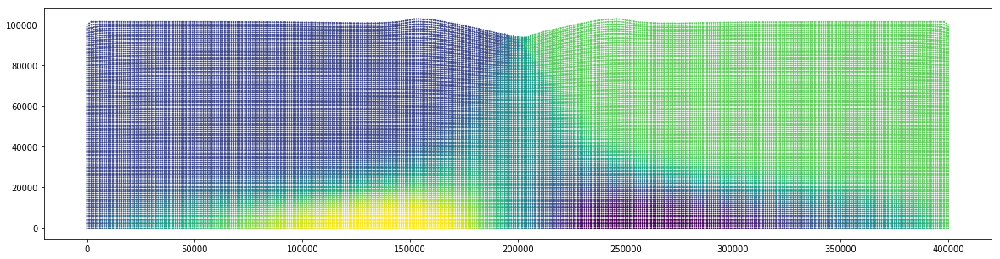

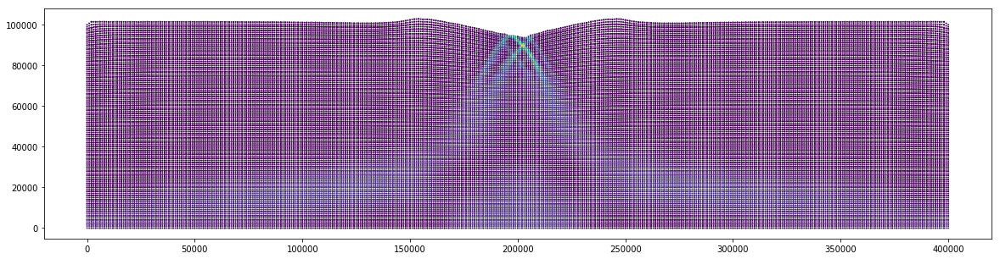

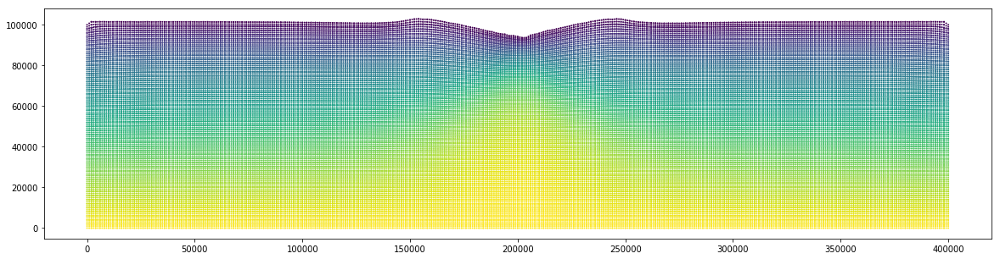

In [141]:
plt.figure(figsize=(20,5))
plt.scatter(zip(*coords)[0],
            zip(*coords)[1],
            c=zip(*vel)[0],
            s=4,edgecolors='')

plt.figure(figsize=(20,5))
plt.scatter(zip(*coords)[0],
            zip(*coords)[1],
            c=zip(*strain)[0],
            s=4,edgecolors='')

plt.figure(figsize=(20,5))
plt.scatter(zip(*coords)[0],
            zip(*coords)[1],
            c=zip(*temp)[0],
            s=4,edgecolors='')


../cookbooks/output-continental_extension/solution/solution-00001.pvtu
../cookbooks/output-continental_extension/solution/solution-00006.pvtu
../cookbooks/output-continental_extension/solution/solution-00011.pvtu
../cookbooks/output-continental_extension/solution/solution-00016.pvtu
../cookbooks/output-continental_extension/solution/solution-00021.pvtu
../cookbooks/output-continental_extension/solution/solution-00026.pvtu
../cookbooks/output-continental_extension/solution/solution-00031.pvtu
../cookbooks/output-continental_extension/solution/solution-00036.pvtu


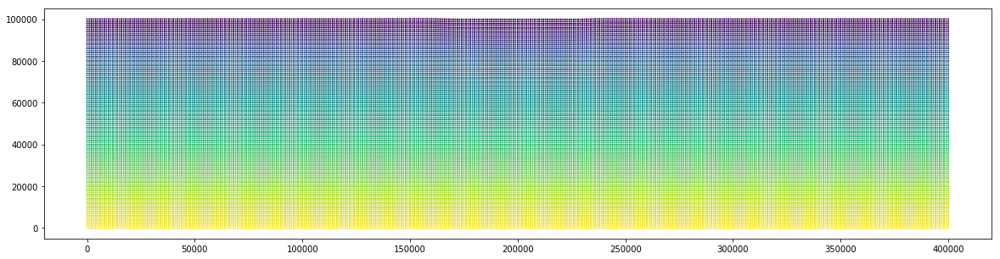

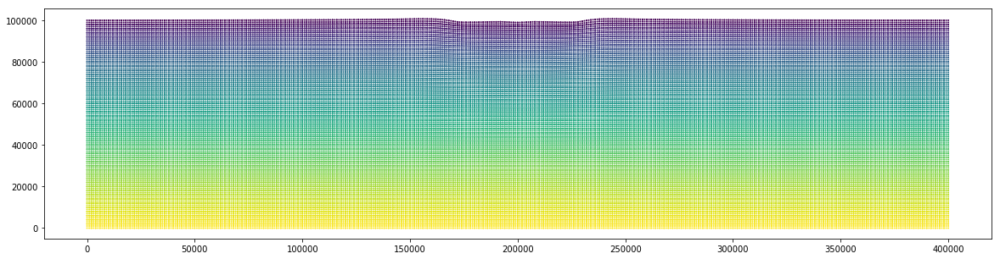

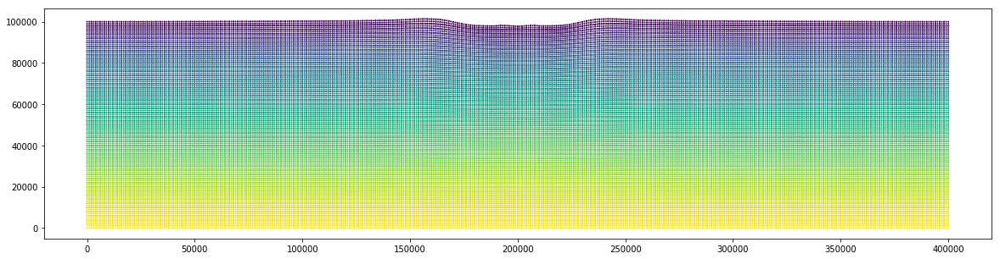

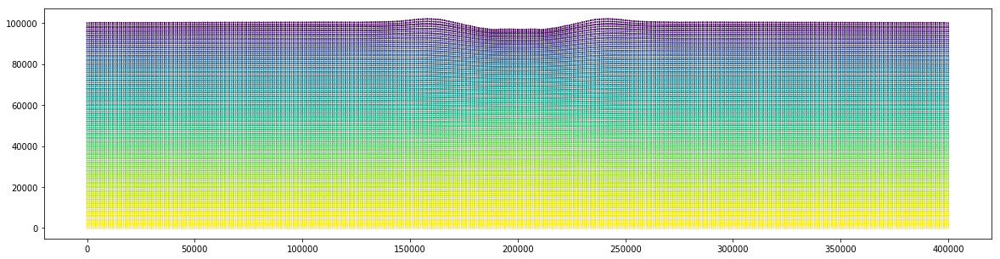

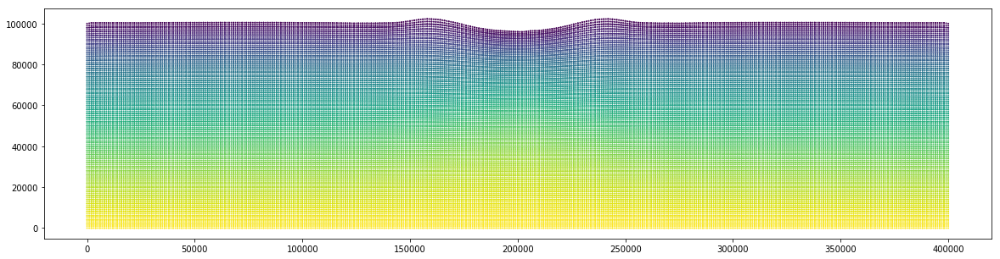

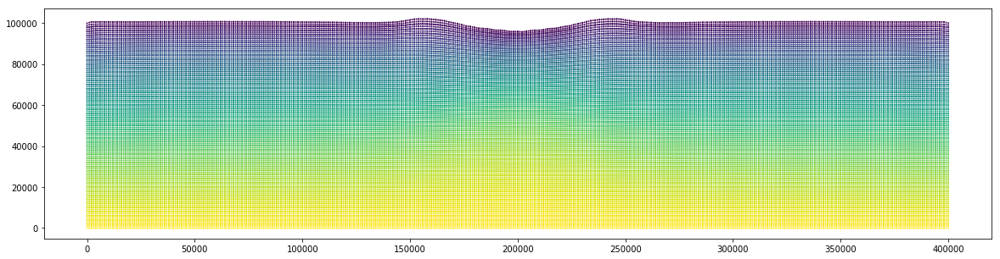

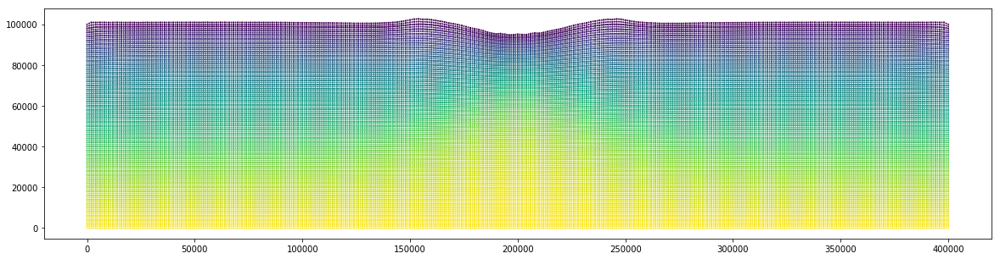

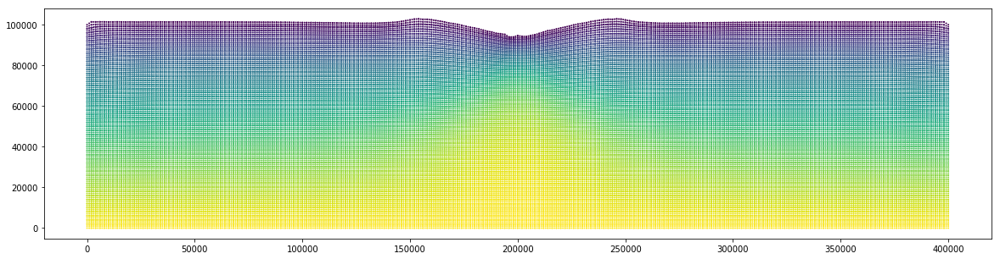

In [9]:
def get_timestep(timestep):
    
    print "../cookbooks/output-continental_extension/solution/solution-%5.5d.pvtu" % timestep
    
    reader=vtk.vtkXMLGenericDataObjectReader()
    reader.SetFileName("../cookbooks/output-continental_extension/solution/solution-%5.5d.pvtu" % timestep)
    reader.Update()
    data=reader.GetOutput()

    velocity = data.GetPointData().GetArray(0)
    temperature = data.GetPointData().GetArray(2)
    viscocity = data.GetPointData().GetArray(9)
    strain_rate = data.GetPointData().GetArray(9)

    coordinates = data.GetPoints().GetData()

    coords = []
    vel = []
    strain = []
    visc = []
    temp = []

    for j in range(0,data.GetNumberOfPoints()):
        coords.append(coordinates.GetTuple(j))
        vel.append(velocity.GetTuple(j))
        strain.append(strain_rate.GetTuple(j))
        visc.append(viscocity.GetTuple(j))
        temp.append(temperature.GetTuple(j))
        
        
    return coords,vel,temp,visc,strain
    
    
for timestep in range(1,37,5):
    
    coordinates,velocity,temperature,viscocity,strain_rate = get_timestep(timestep)
    
    plt.figure(figsize=(20,5))
    plt.scatter(zip(*coordinates)[0],
                zip(*coordinates)[1],
                c=zip(*temperature)[0],
                s=4,edgecolors='')